# Worksheet 2 - Scientific Visualisation MVE080/MMG640

- Daniel Esteban Lahti
- Ana Camila Jimenez Mendoza
- Edin Ahmemulic
- Filip Keerberg

## Colours, proportions, associations and time-series

This is the first worksheet in the course *Scientific Visualisation*. This Jupyter notebook has three functions:

1. It describes the tasks.
2. It (sometimes) provides coding templates that you can use as a basis for your own code.
3. It is a template also for the report that you upload in Canvas.

The tasks are of various types: some are to read some text and then comment on it (no coding), and some are about creating visualisations using plotnine. Once you have finished all the tasks, export this document as an HTML file and upload it in Canvas. 

The goal of these homeworks is to learn how to improve your skills in visualising your science. You solve the homeworks in groups, however annotate all the code (even the theoretical parts) with who solved each question. **Eventhough the homework is submitted as a group you will be *individually* evaluated**. Motivate your choice of graph, legend, colourmap etc below your graph in a separate cell. 

Notice that Jupyter notebooks use [Markdown](https://docs.github.com/en/github/writing-on-github/getting-started-with-writing-and-formatting-on-github/basic-writing-and-formatting-syntax#links) for writing text cells. Make sure you understand the basics. 

Throughout the assignment you shall use a Python workflow.
If you are completely new to Python, take a look at [this page](pythonbasics.org).
Python can do essentially all that MATLAB can, plus more. 
In this course we shall use Python in different contexts, starting with the [Jupyter Notebook interface](https://jupyter-notebook.readthedocs.io/en/stable/notebook.html). 

Matrices and arrays are handled through the NumPy module. [Learn here](https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html) how NumPy is different from MATLAB.

The below loads the packages required for this homework.

In [6]:
import numpy as np
import pandas as pd
from plotnine import *
# Currently in a plotine dependancy they have deprication warning, so 
# we mute warnings to have a better experience
import warnings
warnings.filterwarnings("ignore")

# A nice color palette for categorical data 
cbPalette = ["#E69F00", "#56B4E9", "#009E73", 
             "#F0E442", "#0072B2", "#D55E00", 
             "#CC79A7", "#999999"]

## Task 1

**Worked on by: Edin and Filip**

Read Chapter 4, 10, 11, 12 and 13 of [Fundamentals of Data Visualizations](https://clauswilke.com/dataviz/), then answer the questions below.

### Question 1.1

During Lecture 3, we discussed colour palettes for categorical data. Briefly describe and motivate the three key properties we want a good categorical colour palette to have.

### Answer 1.1
We want colors that are...
* Distinct enough from each other so one can quickly match with legend

* Colorblind-friendly

* Easy to name! (No "maroon" vs "dark red" confusion!)

### Question 1.2

In Lecture 3, we used pie and bar charts to visualise proportions. Briefly discuss the benefits and drawbacks with using bar charts and pie charts for this purpose.

### Answer 1.2
* Pie charts show "part of whole" intuitively at a glance... but it's hard to tell exact amounts from angles, so each circle section must be complemented with numbers, which can be noisy and lead to overlap. It especially gets noisy when there are many groups within the pie chart.

* Bar charts make it easier to compare values accurately and are readable even when there are 10+ groups... but they give less of an immediate sense of "part of whole" like pie charts do, and they also take up more space.

### Question 1.3

In Lecture 3, we used a mosaic plot to analyse the Titanic data. Now consider Fig. 11.3 in the course book, what are the main takeaways we can read from this visual?

### Answer 1.3
* The emerging era had the least amount of bridges built in it, the mature era hade the most amount of bridges built in it.
* The most common material used for bridges in the crafts era was wood, then all eras thereafter, steel became the big player.
* Wood and iron was used less and less as humankind progressed, in favor of using steel.

### Question 1.4

In Lecture 4 we used a bubble chart (see also Fig. 12.3 in the course book). Why is this typically not a good option if we want to identify relationships (e.g. correlated variables) in the data?

### Answer 1.4
Humans are bad at judging area and bubbles tend to overlap which can make clusters hard to see or hide scatter shape. If the goal is to understand correlation between variables, bubble charts add unnecessary visual complexity and cognitive load!

### Question 1.5

Consider Fig. 13.10 in the course book. What is main benefit of a connected scatter plot, and what is important to think about when creating such a visual?

### Answer 1.5
The main benefit is that a connected scatter plot actually shows the trajectory of a relationship between two variables over time/space/etc. It's important to make the ordering and direction clear so the sequence is followable, with e.g. gradients and labels as they do in Fig. 13.10 or with arrows. Connected scatter plots can easily get tangled and noisy if there are many loops and crossings, so you might need to smooth the path or be EXTRA clear with labeling/directional cues.


## Colours 

For this part reading chapter 4 in [Fundamentals of Data Visualizations](https://clauswilke.com/dataviz/) can help.

### Question 2.1

**Worked on by: Camila**

Colours can be a powerful tool for highlighting. Using the Simpson's paradox data on Canvas, make a scatter plot where you highlight category D3 (all other categories can have the same colour). Briefly motivate your choice of palette.

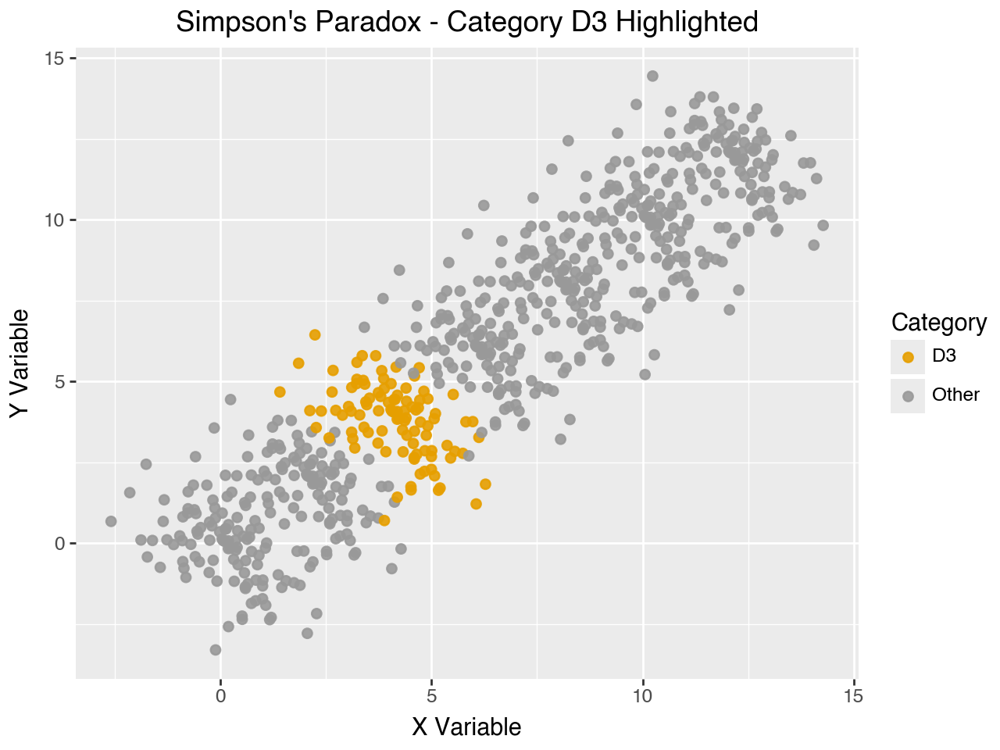

In [ ]:
# Insert code here 
# Remember to print the visual 
simpsons_data = pd.read_csv('Homework2_resources/Simpson_paradox.csv')

simpsons_data['highlight'] = simpsons_data['dataset'].apply(
    lambda x: 'D3' if x == 'D3' else 'Other'
)

(ggplot(simpsons_data, aes(x='x', y='y', color='highlight')) +
        geom_point(size=2, alpha=0.9) +
        scale_color_manual(values={'D3': cbPalette[0], 'Other': cbPalette[7]}) +
        labs(title="Simpson's Paradox - Category D3 Highlighted",
             x='X Variable',
             y='Y Variable',
             color='Category')
)

# print(plot)

*Brief motivation*

We highlighted category D3 using a bright color (orange) while displaying all other categories in neutral gray. This creates a strong visual contrast that immediately draws attention to D3 points. The approach effectively isolates the D3 pattern for examining Simpson's paradox while maintaining context by keeping other data visible but not emphasized. This color strategy reduces cognitive load by focusing viewer attention on the relevant category.

### Question 2.2 

**Worked on by: Daniel and Filip**

In Lecture 3, when comparing colourmaps, I plotted this function

$$
    z = 0.1 \mathrm{sin}(r) + \mathrm{cos}(r^2) \mathrm{exp}\Big(-\frac{x}{4 \pi} \Big) \ \mathrm{where} \\
    r = x^2 + y^2 \quad x, y \in [-4\pi, 4\pi],
$$

where I used colours to represent $z$. 

Now plot (as in Lecture 3 slide 3) the function

$$
    z = 0.1 \mathrm{sin}(r) + \mathrm{cos}(r^2) \mathrm{exp}\Big(-\frac{(0.5x)^2}{4 \pi} \Big) \ \mathrm{where} \\
    r = x^2 + y^2 \quad x, y \in [-4\pi, 4\pi],
$$

using three different [colormaps](https://matplotlib.org/stable/tutorials/colors/colormaps.html) that are sufficiently distinct. Using three monochrome maps (e.g Greys, Blues and Purples) does not count as sufficiently distinct. Code for how to use the rainbow desaturated colourmap is in the Lecture 3 notebook on Canvas.

For each colourmap briefly discuss its benefits based on what you can see from the plots you have created.

In [12]:
x = np.linspace(-4*np.pi, 4*np.pi, 500)
y = np.linspace(-4*np.pi, 4*np.pi, 500)
X, Y = np.meshgrid(x, y)

r = np.sqrt(X**2 + Y**2)
z = 0.1*np.sin(r) + np.cos(r**2)*np.exp(-(0.5*X)**2 / (4*np.pi))

# dataframe for plotting
data = pd.DataFrame({
    'x': X.flatten(),
    'y': Y.flatten(),
    'z': z.flatten()
})

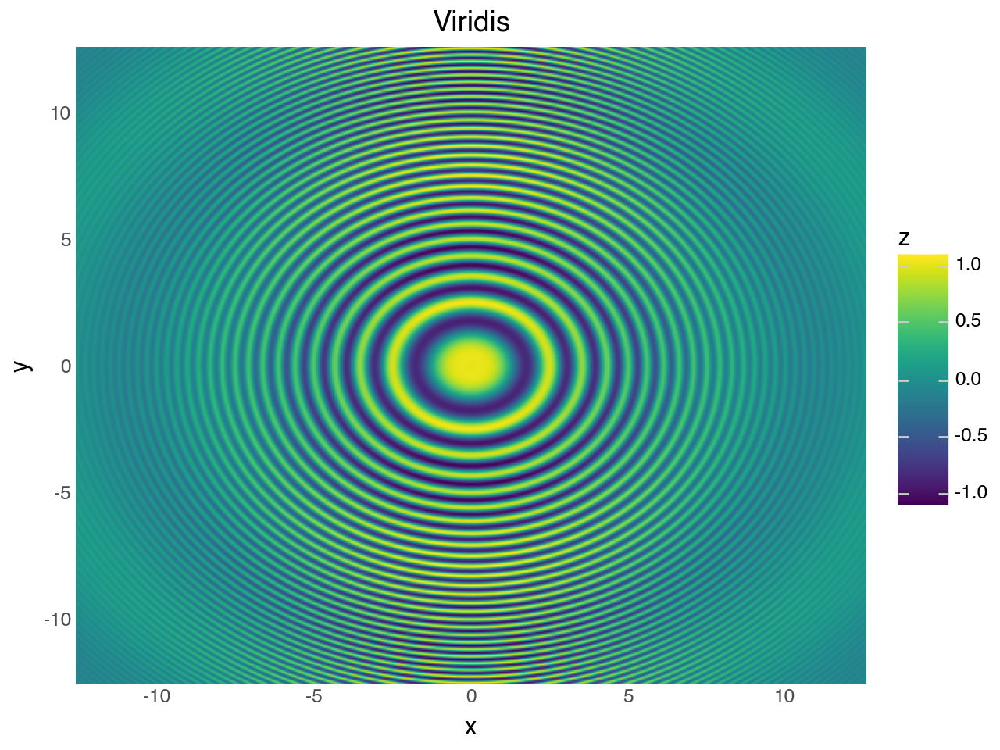

In [14]:
# Insert code here for colormap 1
# Remember to print the visual 
#p1 = 
(ggplot(data, aes('x', 'y', fill='z'))
    + geom_raster()
    + scale_fill_cmap("viridis")
    + scale_x_continuous(expand=(0, 0)) 
    + scale_y_continuous(expand=(0, 0))
    + labs(title = "Viridis")
    + theme_minimal())

# print(p1)

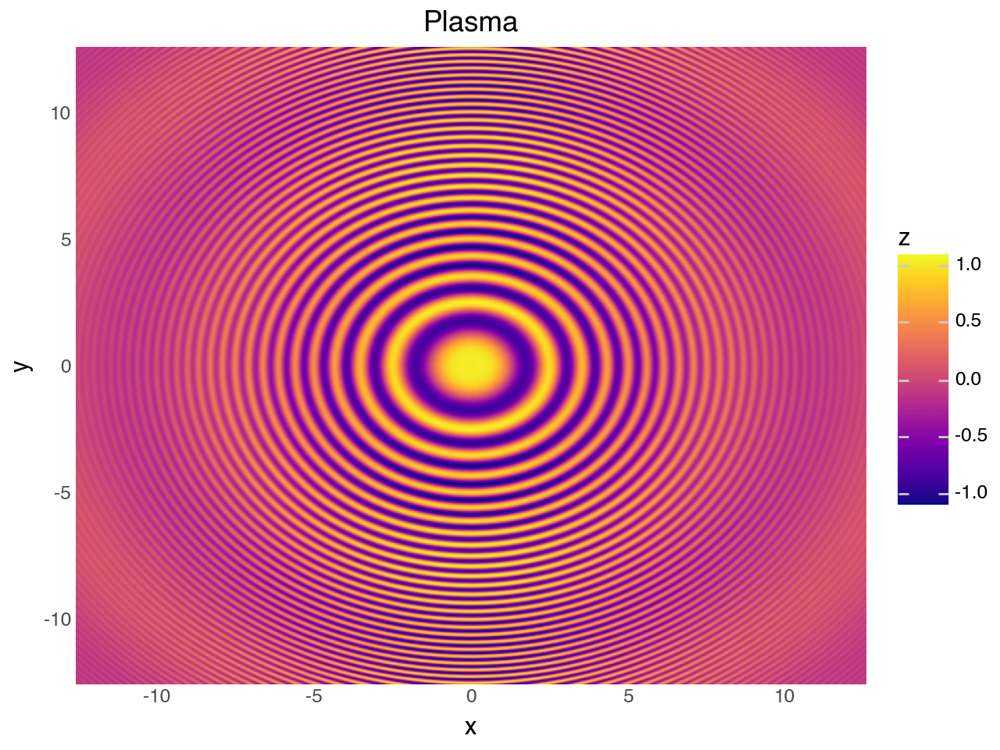

In [15]:
# Insert code here for colormap 2
# Remember to print the visual 
#p2 = 
(ggplot(data, aes('x', 'y', fill='z'))
    + geom_raster()
    + scale_fill_cmap("plasma")
    + scale_x_continuous(expand=(0, 0)) 
    + scale_y_continuous(expand=(0, 0))
    + labs(title = "Plasma")
    + theme_minimal())

#print(p2)

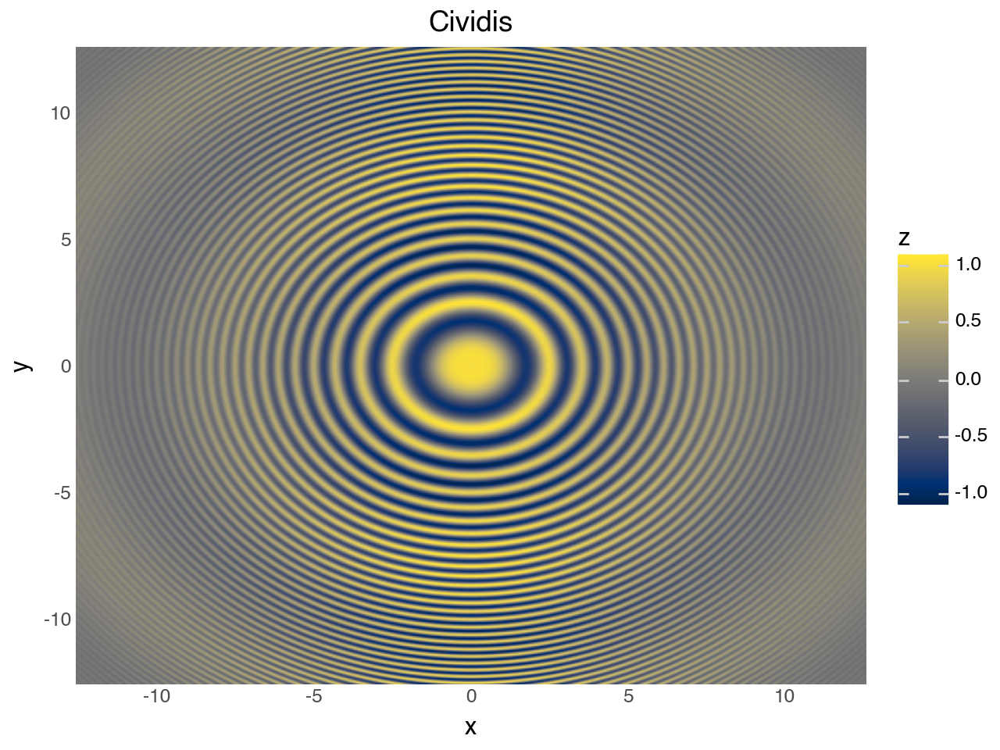

In [16]:
# Insert code here for colormap 3
# Remember to print the visual 
#p3 = 
(ggplot(data, aes('x', 'y', fill='z'))
    + geom_raster()
    + scale_fill_cmap("cividis")
    + scale_x_continuous(expand=(0, 0)) 
    + scale_y_continuous(expand=(0, 0))
    + labs(title = "Cividis")
    + theme_minimal())

#print(p3)

*Brief discussion*

- **Colormap 1 - Viridis:**
Viridis shows the concentric rings really clearly, with a smooth color transition from dark purple to bright yellow. What makes it special is that the color changes are perceptually uniform—meaning equal steps in data values appear as equal steps in color brightness, which makes it easier to interpret the data quantitatively. This helps you understand how the function decays and spot the wave patterns accurately. Plus, it works well for people with colorblindness and looks decent even if you print it in black and white.

- **Colormap 2 - Plasma:**
Plasma makes the high values really pop, with those bright yellow peaks that make the center of the image super eye catching. The purple to yellow gradient helps you tell apart the positive and negative parts of the function, though it can make the extreme values look more dramatic than they actually are.

- **Colormap 3 - Cividis:**
Cividis is the best choice if you're concerned about people with colorblindness being able to see your plot without issues. The blue to yellow scheme shows the radial symmetry and wave patterns well, though the colors are less intense than Viridis or Plasma. It's perfect for presentations where you want to make sure everyone can see the details clearly without losing any visual information.

### Question 2.3

**Worked on by: Edin and Daniel**

On Canvas, I have uploaded a forest coverage dataset. To load the data you can use the code below. Produce two visuals, one where it is easy to see forest coverage for different countries in the world, and one where it is easy to see which countries in the world have a below median forest coverage. Briefly motivate choice of colourmap.

In [24]:
# Code for reading the data in correct format 
import geopandas as gpd
url = "https://naciscdn.org/naturalearth/110m/cultural/ne_110m_admin_0_countries.zip"
world = gpd.read_file(url)
data_forest = pd.read_csv("Homework2_resources/Forest_tidy-2.csv")

# Reading geometry
world_wsg84 = world.to_crs("EPSG:4326")
data_world_forest = world_wsg84.merge(data_forest, left_on="SOVEREIGNT", right_on="Country")

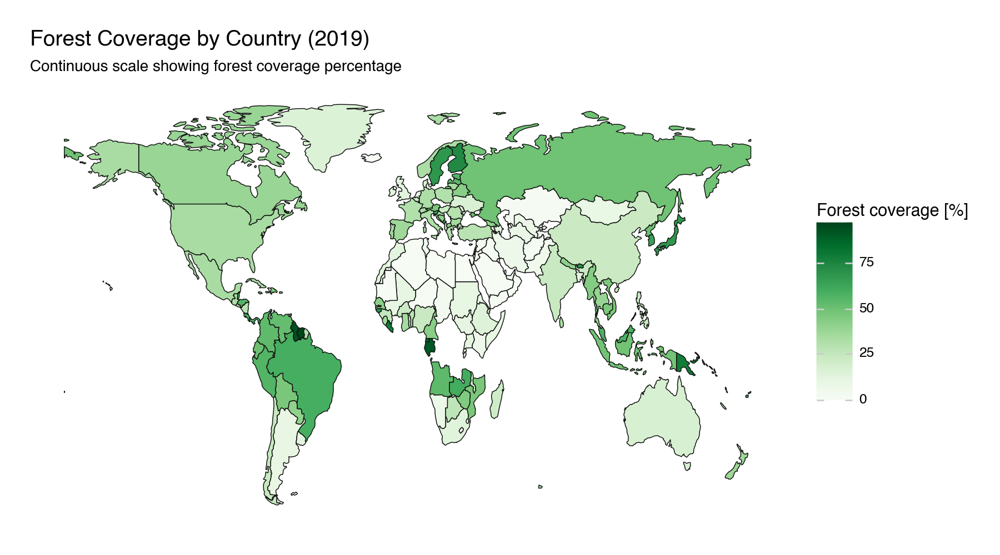

In [54]:
# Insert code here for visual 1
# Remember to print the visual 

# visual_1 = 
(
    ggplot(data_world_forest, aes(fill="2019_forest"))
    + geom_map(size=0.3)
    + labs(
        title="Forest Coverage by Country (2019)",
        subtitle="Continuous scale showing forest coverage percentage"
    )
    + scale_fill_cmap("Greens", name="Forest coverage [%]")
    + theme_void()
    + theme(
        plot_title=element_text(size=14, face="bold"),
        plot_margin=0.03,
        plot_subtitle=element_text(size=10),
        legend_position="right",
        figure_size=(9, 5)
    )
)

# print(visual_1)

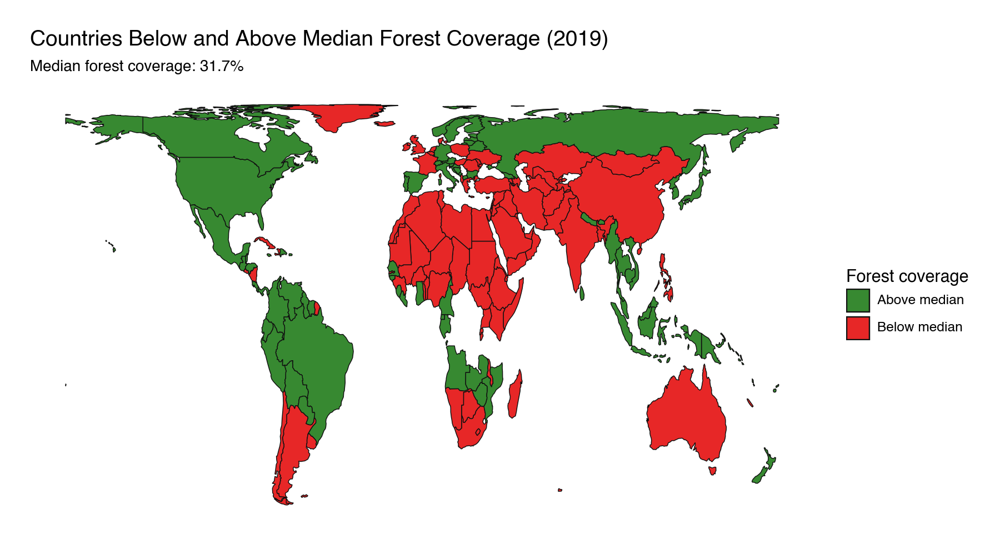

In [53]:
# Insert code here for visual 2
# Remember to print the visual 

median_forest = data_forest['2019_forest'].median()

data_forest['below_median'] = data_forest['2019_forest'] < median_forest
data_forest['forest_category'] = data_forest['below_median'].map({
    True: 'Below median',
    False: 'Above median'
})

world_lambert = world.to_crs("EPSG:6933")
data_world_forest_cat = world_lambert.merge(data_forest, left_on="SOVEREIGNT", right_on="Country")

#visual_2 = 
(
    ggplot(data_world_forest_cat, aes(fill="forest_category"))
    + geom_map(size=0.3)
    + labs(
        title="Countries Below and Above Median Forest Coverage (2019)",
        subtitle=f"Median forest coverage: {median_forest:.1f}%"
    )
    + scale_fill_manual(
        values=["#378931", "#E72727"],
        na_value="lightgrey",
        name="Forest coverage"
    )
    + theme_void()
    + theme(
        plot_title=element_text(size=14, face="bold"),
        plot_margin=0.03,
        plot_subtitle=element_text(size=10),
        legend_position="right",
        figure_size=(9, 5)
    )
)

#print(visual_2)

*Brief motivation*

For the first visualization, we used the "Greens" colormap because it creates an intuitive connection between color and forest coverage. The sequential green scale makes it easy to identify patterns at a glance, with darker shades representing higher forest coverage percentages. This continuous scale is ideal for showing quantitative differences across countries and allows viewers to quickly spot regions with the most and least forest coverage.

For the second visualization, we chose a binary green-red palette to highlight countries above and below the median. Green represents countries with above-median forest coverage, maintaining the forest theme from the first map, while red immediately draws attention to countries below the median threshold. This contrasting color scheme makes it straightforward to identify which countries fall below the median, effectively answering the question with strong visual clarity.

### Question 2.4

**Worked on by: Camila and Daniel**

On slide 22 in Lecture 3 (and on Canvas), there is a recreation using Swedish data of the famous cover page for the economist climate issue. Using the weather data on Canvas, recreate this visual.

**Hint 1**: You can use the following syntax to get the colours correct;

~~~
# Color palette 
color_list = [np.array([103,0,31]) / 256,
              np.array([178,24,43]) / 256, 
              np.array([214,96,77]) / 256, 
              np.array([244,165,130]) / 256, 
              np.array([253,219,199]) / 256, 
              np.array([247,247,247]) / 256, 
              np.array([209,229,240]) / 256, 
              np.array([146,197,222]) / 256, 
              np.array([67,147,195]) / 256, 
              np.array([33,102,172]) / 256, 
              np.array([5,48,97]) / 256]

# Used in the ggplot call 
# [::-1] reverses an array (I entered the color in wrong order :)
    + scale_fill_gradientn(colors=color_list[::-1], name = "Temperature [C]")
~~~


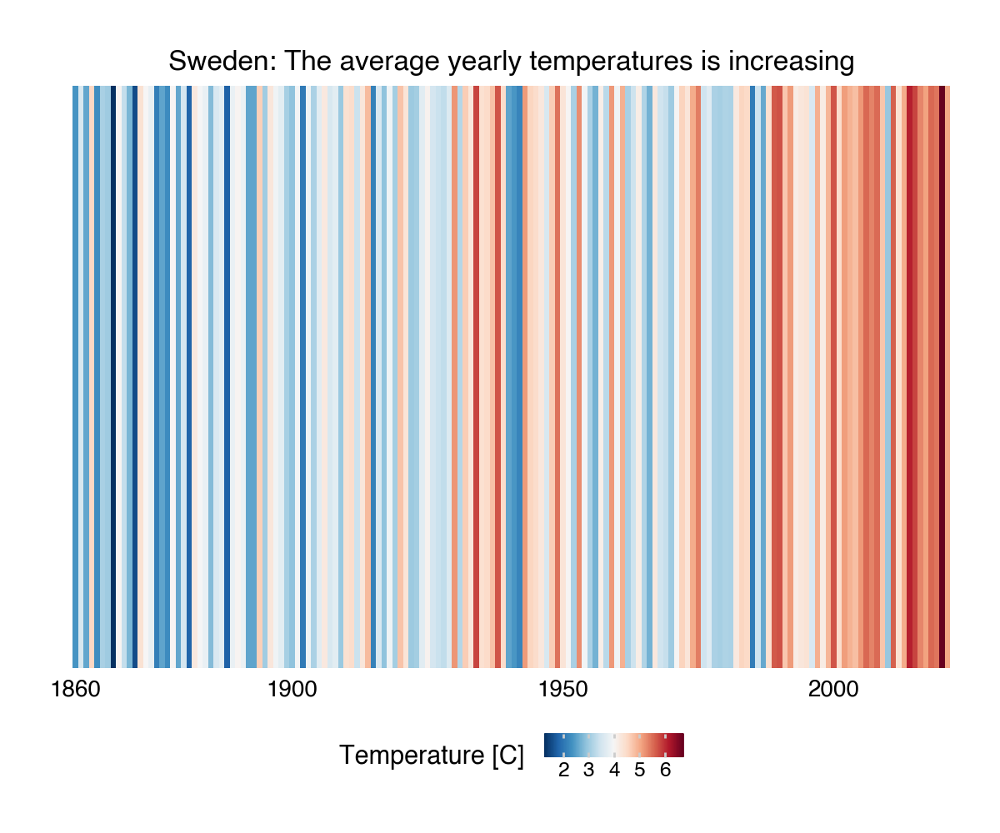

In [60]:
# Insert code here 
# Remember to print the visual 
weather_data = pd.read_csv("Homework2_resources/Weather_avg.csv")

# Color palette
color_list = [np.array([103,0,31]) / 256,
              np.array([178,24,43]) / 256, 
              np.array([214,96,77]) / 256, 
              np.array([244,165,130]) / 256, 
              np.array([253,219,199]) / 256, 
              np.array([247,247,247]) / 256, 
              np.array([209,229,240]) / 256, 
              np.array([146,197,222]) / 256, 
              np.array([67,147,195]) / 256, 
              np.array([33,102,172]) / 256, 
              np.array([5,48,97]) / 256]


#visual_3 = 
(
    ggplot(weather_data, aes(x='Year', y='Val', fill='AvgT'))
    + geom_tile()
    + scale_fill_gradientn(colors=color_list[::-1], name="Temperature [C]")
    + scale_x_continuous(
        breaks=[1860, 1900, 1950, 2000],
        expand=(0, 0)
    )
    + scale_y_continuous(expand=(0, 0))
    + labs(
        title="Sweden: The average yearly temperatures is increasing"
    )
    + theme_void()
    + theme(
        plot_title=element_text(size=12, ha='center', face='bold'),
        plot_margin=0.05,
        axis_text_x=element_text(size=10, margin={'t': 5}),
        axis_ticks_major_x=element_line(),
        legend_position='bottom',
        legend_direction='horizontal',
        legend_key_width=60,
        legend_key_height=10,
        figure_size=(6, 5)
    )
)

#print(visual_3)

## Time-series

For this part reading chapter 13 in [Fundamentals of Data Visualizations](https://clauswilke.com/dataviz/) can help.



### Question 3.1

**Worked on by: Edin**

In the lecture, I showed how we can use points, lines or both to visualise a single time series. Another way is to use area (Fig. 13.4 in the [course book](https://clauswilke.com/dataviz/)). Using the inflation data (on Canvas), choose a country and visualise its inflation over time using i) dots, ii) lines and iii) line with area shaded under it. Briefly discuss the benefit of also including the area.

In [62]:
inflation_data = pd.read_csv("Homework2_resources/Inflation_data_homework.csv")

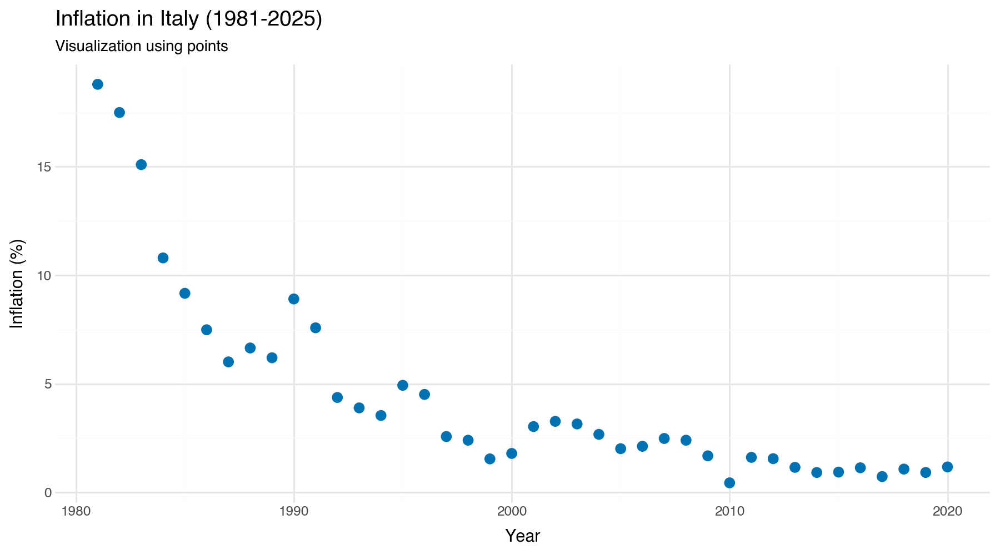

In [68]:
# Insert code here for dots
# Remember to print the visual 
country_selected = "Italy"
country_data = inflation_data[inflation_data['country'] == country_selected].copy()

#dots_plot = 
(
    ggplot(country_data, aes(x='Year', y='Inflation'))
    + geom_point(size=3, color='#0072B2')
    + labs(
        title=f"Inflation in {country_selected} (1981-2025)",
        subtitle="Visualization using points",
        x="Year",
        y="Inflation (%)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        figure_size=(9, 5)
    )
)

#print(dots_plot)

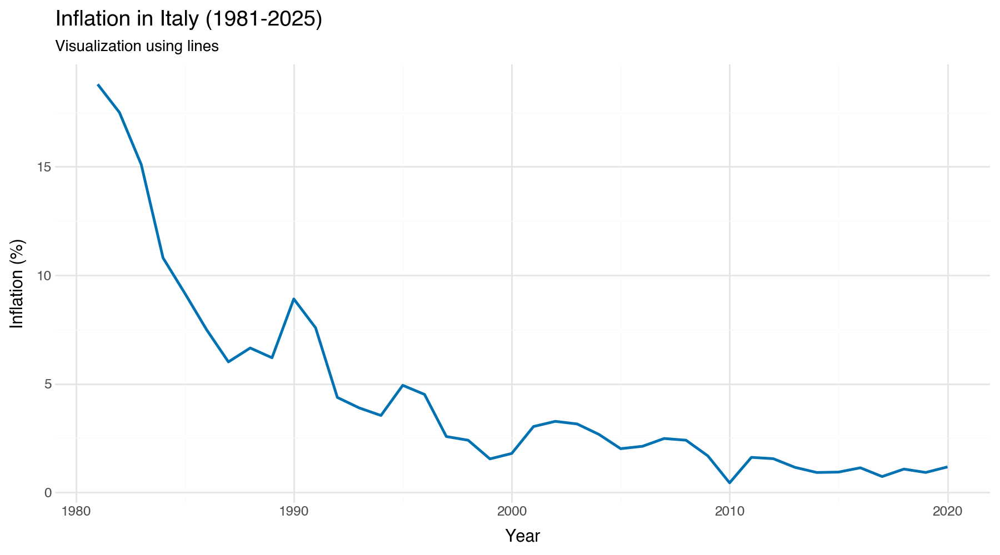

In [70]:
# Insert code here for lines
# Remember to print the visual 
#lines_plot = 
(
    ggplot(country_data, aes(x='Year', y='Inflation'))
    + geom_line(size=1, color='#0072B2')
    + labs(
        title=f"Inflation in {country_selected} (1981-2025)",
        subtitle="Visualization using lines",
        x="Year",
        y="Inflation (%)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        figure_size=(9, 5)
    )
)

#print(lines_plot)

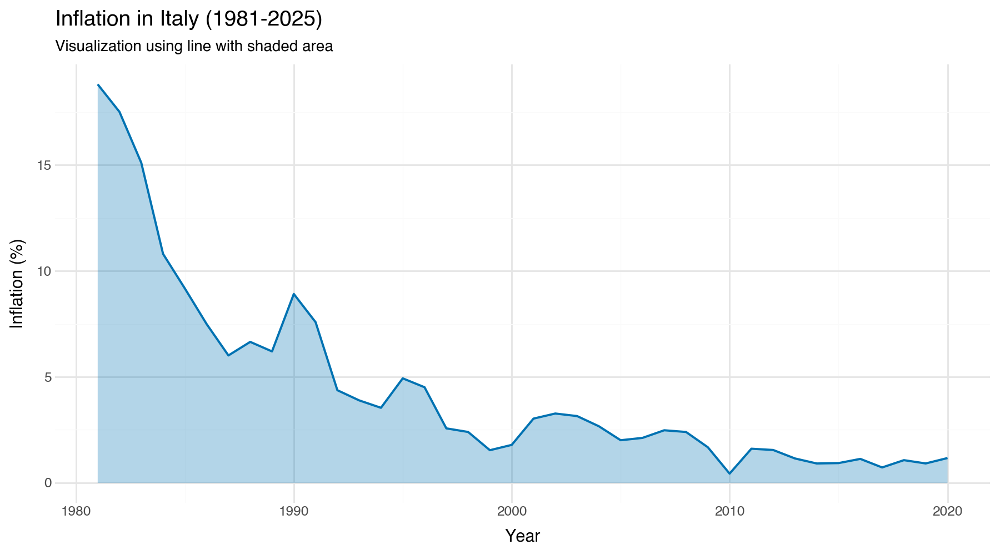

In [73]:
# Insert code here for area
# Remember to print the visual 
#area_plot = 
(
    ggplot(country_data, aes(x='Year', y='Inflation'))
    + geom_area(fill='#0072B2', alpha=0.3)
    + geom_line(size=0.8, color='#0072B2')
    + labs(
        title=f"Inflation in {country_selected} (1981-2025)",
        subtitle="Visualization using line with shaded area",
        x="Year",
        y="Inflation (%)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        figure_size=(9, 5)
    )
)

#print(area_plot)

*Brief motivation*

The shaded area beneath the line enhances the visualization by emphasizing the magnitude of inflation over time. While points show individual observations and lines reveal trends, the filled area provides visual weight that helps viewers quickly grasp periods of high versus low inflation. The area representation also reinforces that inflation is a continuous accumulating measure rather than discrete events. This makes the visualization more intuitive, especially for audiences less familiar with time series data, as the filled space naturally draws attention to the scale and significance of the changes over time.

### Question 3.2

**Worked on by: Camila and Filip**

Using the inflation data, choose 7 countries and visualise in a single plot (you are allowed to use facets) their inflation over time. I recommend a you-are-here graphic (slide 12 Lecture 4). 

Briefly motivate your choice of plot.

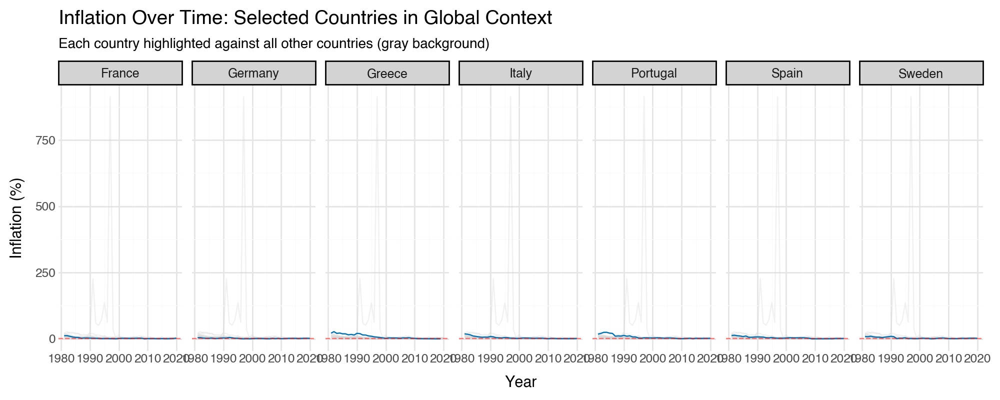

In [82]:
# Insert code here 
# Remember to print the visual 

countries_selected = ['Sweden', 'Italy', 'France', 'Germany', 'Portugal', 'Greece', 'Spain']

selected_data = inflation_data[inflation_data['country'].isin(countries_selected)].copy()

background_list = []
for country in countries_selected:
    temp = inflation_data.copy()
    temp['facet_country'] = country
    background_list.append(temp)

background_expanded = pd.concat(background_list, ignore_index=True)

selected_data['facet_country'] = selected_data['country']

#inflation_facet = 
(
    ggplot()
    + geom_line(
        background_expanded, 
        aes(x='Year', y='Inflation', group='country'),
        color='lightgrey',
        size=0.5,
        alpha=0.3
    )
    + geom_line(
        selected_data,
        aes(x='Year', y='Inflation'),
        color='#0072B2',
        size=0.5
    )
    + facet_wrap('~facet_country', ncol=7)
    + geom_hline(yintercept=2, linetype='dashed', color='red', alpha=0.5)
    + labs(
        title="Inflation Over Time: Selected Countries in Global Context",
        subtitle="Each country highlighted against all other countries (gray background)",
        x="Year",
        y="Inflation (%)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        strip_background=element_rect(fill='lightgray', color='black'),
        strip_text=element_text(size=9, face='bold'),
        figure_size=(10, 4)
    )
)

#print(inflation_facet)

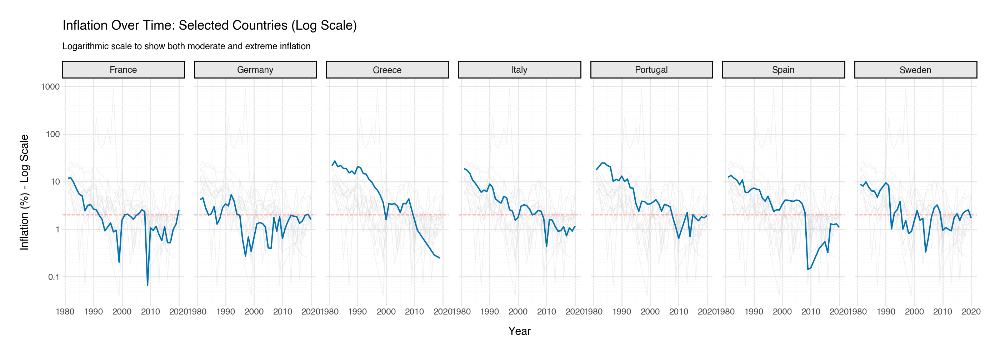

In [ ]:
#inflation_facet_log = 
(
    ggplot()
    + geom_line(
        background_expanded, 
        aes(x='Year', y='Inflation', group='country'),
        color='lightgrey',
        size=0.4,
        alpha=0.3
    )
    + geom_line(
        selected_data,
        aes(x='Year', y='Inflation'),
        color='#0072B2',
        size=0.8
    )
    + facet_wrap('~facet_country', ncol=7)
    + scale_y_log10()
    + geom_hline(yintercept=2, linetype='dashed', color='red', alpha=0.5)
    + labs(
        title="Inflation Over Time: Selected Countries (Log Scale)",
        subtitle="Logarithmic scale to show both moderate and extreme inflation",
        x="Year",
        y="Inflation (%) - Log Scale"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=13, face='bold'),
        plot_subtitle=element_text(size=9),
        strip_background=element_rect(fill='#e8e8e8'),
        strip_text=element_text(size=9, face='bold'),
        figure_size=(14, 5)
    )
)

#print(inflation_facet_log)

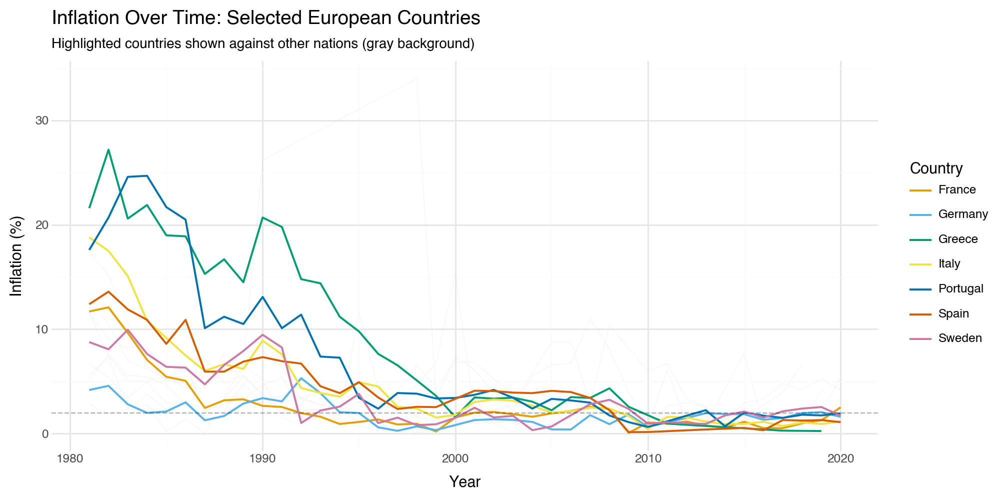

In [102]:
inflation_threshold = 40
background_reasonable = inflation_data[
    (~inflation_data['country'].isin(countries_selected)) & 
    (inflation_data['Inflation'] <= inflation_threshold)
].copy()

selected_data = inflation_data[inflation_data['country'].isin(countries_selected)].copy()

#inflation_simple = 
(
    ggplot()
    + geom_line(
        background_reasonable,
        aes(x='Year', y='Inflation', group='country'),
        color='lightgrey',
        size=0.3,
        alpha=0.2
    )
    + geom_line(
        selected_data,
        aes(x='Year', y='Inflation', color='country'),
        size=0.8
    )
    + geom_hline(yintercept=2, linetype='dashed', color='black', alpha=0.3)
    + scale_color_manual(values=cbPalette[:7])
    + labs(
        title="Inflation Over Time: Selected European Countries",
        subtitle="Highlighted countries shown against other nations (gray background)",
        x="Year",
        y="Inflation (%)",
        color="Country"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        legend_position='right',
        figure_size=(10, 5)
    )
)

#print(inflation_simple)

*Brief motivation*

WE NEED TO PICK ONE

### Question 3.3 

**Worked on by: Filip**

The connected scatter plot (Fig. 13.10 in the [course book](https://clauswilke.com/dataviz/)) is an approach that allows us to visualise two separate time-dependent variables. On the webpage, I have uploaded an example for a connected scatter plot where I plot unemployment rate and apartment prices for Sweden from 1996-2020. Use the dataset on Canvas to recreate this visual. Briefly comment what you think is the main takeaway message from the plot. 

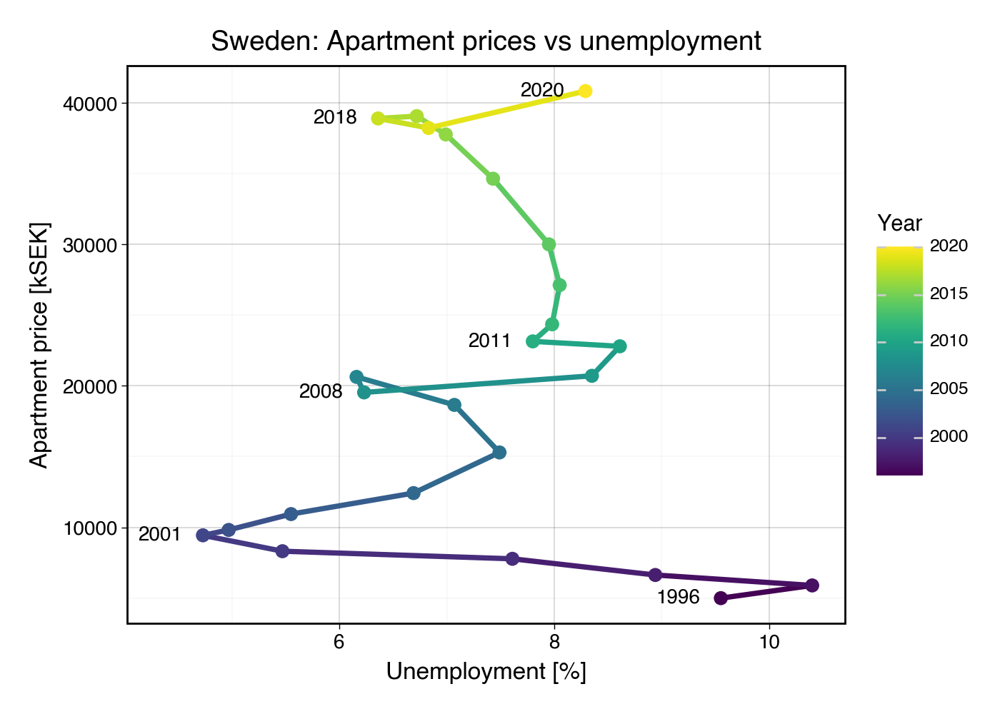

In [135]:
# Insert code here 
# Remember to print the visual 

sweden_data = pd.read_csv("Homework2_resources/House_unemployed.csv")

key_years = [1996, 2001, 2008, 2011, 2018, 2020]
sweden_data['Year_label'] = sweden_data['Year'].apply(
    lambda x: str(int(x)) if x in key_years else ''
)

#connected_scatter = 
(
    ggplot(sweden_data)
    + geom_path(
        aes(x='Unemployment', y='price', color='Year'),
        size=1.5
    )
    + geom_point(
        aes(x='Unemployment', y='price', color='Year'),
        size=3
    )
    + geom_text(
        aes(x='Unemployment', y='price', label='Year_label'),
        size=10,
        nudge_x=-0.4,
        fontweight='bold'
    )
    + scale_color_cmap('viridis', name='Year')
    + labs(
        title="Sweden: Apartment prices vs unemployment",
        x="Unemployment [%]",
        y="Apartment price [kSEK]"
    )
    + theme_linedraw()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        axis_title=element_text(size=12),
        axis_text=element_text(size=10),
        plot_margin=0.03,
        legend_position='right',
        figure_size=(7, 5)
    )
)

#print(connected_scatter)

*Brief motivation*

The plot shows that apartment prices and unemployment followed an inverse relationship until around 2011, but then decoupled dramatically. After 2011, prices skyrocketed while unemployment stayed relatively flat, indicating that housing prices became driven by factors beyond the labor market, likely low interest rates and housing supply constraints.

## Proportions 

For this part reading chapter 10-11 in [Fundamentals of Data Visualizations](https://clauswilke.com/dataviz/) can help.

### Question 4.1 

**Worked on by: Everyone**

Consider the Swedish election data from 2010 and 2014 which I have added below. Visualize the data such that it is easy to see, in a single plot, which was the third biggest party in 2010 and 2014.


In [136]:
swedish_election_2010 = pd.DataFrame({"Party" : ["Social Democrats", "Left Party", "Green Party", "Centre Party", "Liberal Party", "Moderate Party", "Christian Democrats", "Sweden Democrats"],
                                      "Number_of_seats" : [112, 19, 25, 23, 24, 107, 19, 20],
                                      "Year" : 2010, 
                                      "Color" : ["#E8112d", "#DA291C", "#83CF39", "#009933", "#006AB3", "#52BDEC", "#000077", "#DDDD00"]})
swedish_election_2014 = pd.DataFrame({"Party" : ["Social Democrats", "Left Party", "Green Party", "Centre Party", "Liberal Party", "Moderate Party", "Christian Democrats", "Sweden Democrats"],
                                      "Number_of_seats" : [113, 21, 25, 22, 19, 84, 16, 49],
                                      "Year" : 2014, 
                                      "Color" : ["#E8112d", "#DA291C", "#83CF39", "#009933", "#006AB3", "#52BDEC", "#000077", "#DDDD00"]})
swedish_election_2010["Frac_seats"] = swedish_election_2010["Number_of_seats"] / np.sum(swedish_election_2010["Number_of_seats"]) * 100
swedish_election_2014["Frac_seats"] = swedish_election_2014["Number_of_seats"] / np.sum(swedish_election_2014["Number_of_seats"]) * 100

data_election = pd.concat([swedish_election_2010, swedish_election_2014])
# Remember to print the visual 

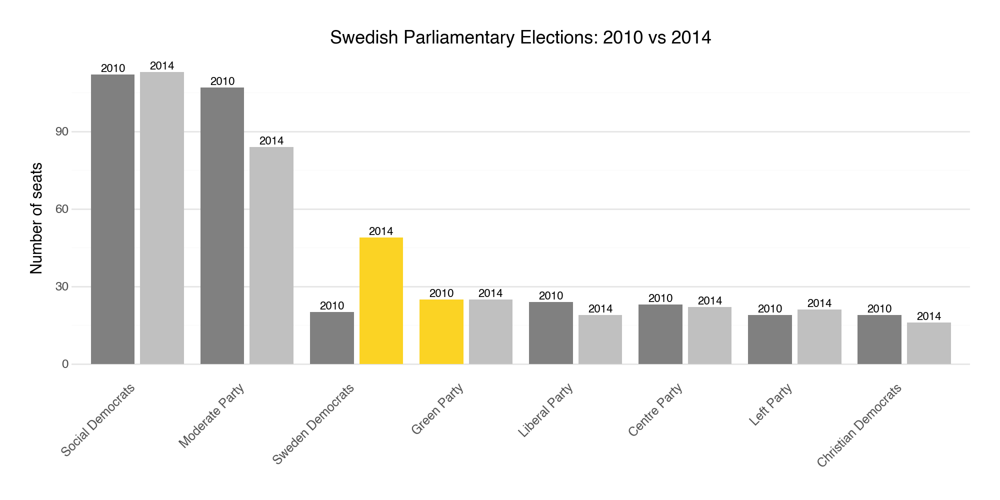

In [ ]:
max_seats = data_election.groupby('Party')['Number_of_seats'].max().sort_values(ascending=False)
party_order = max_seats.index.tolist()

data_election['Party'] = pd.Categorical(data_election['Party'], categories=party_order, ordered=True)

data_election['Rank'] = data_election.groupby('Year')['Number_of_seats'].rank(ascending=False, method='dense')

data_election['Party_Year'] = data_election['Party'].astype(str) + '_' + data_election['Year'].astype(str)

def assign_colors(row):
    if row['Rank'] == 3:
        if row['Year'] == 2010:
            return "#FBD324" 
        else: 
            return "#FBD324" 
    else:
        if row['Year'] == 2010:
            return '#808080'
        else: 
            return '#C0C0C0'

data_election['Bar_Color'] = data_election.apply(assign_colors, axis=1)

bar_colors = dict(zip(data_election['Party_Year'], data_election['Bar_Color']))

#election_plot = 
(
    ggplot(data_election, aes(x='Party', y='Number_of_seats', fill='Party_Year'))
    + geom_col(aes(group='Year'), position=position_dodge(width=0.9), width=0.8)
    + geom_text(
        aes(label='Year', group='Year'),
        position=position_dodge(width=0.9),
        va='bottom',
        size=8,
        fontweight='bold'
    )
    + scale_fill_manual(values=bar_colors)
    + labs(
        title="Swedish Parliamentary Elections: 2010 vs 2014",
        x="",
        y="Number of seats"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=13, face='bold'),
        plot_subtitle=element_text(size=9),
        axis_text_x=element_text(angle=45, hjust=1, size=9),
        legend_position='none',
        plot_margin=0.03,
        figure_size=(10, 5),
        panel_grid_major_x=element_blank()
    )
)

#print(election_plot)

### Question 4.2

**Worked on by: Edin, Daniel and Filip**

In the lecture, we discuss that stalked charts (e.g. stacked densities or stacked bars) often do not work if we want to study individual parts. Consider the stacked density graph on slide 29 in Lecture 3. Using the data on Canvas, create two different plots from which it is easier to see how the fraction GDP for the different has changed over the years. Motivate your choice. 

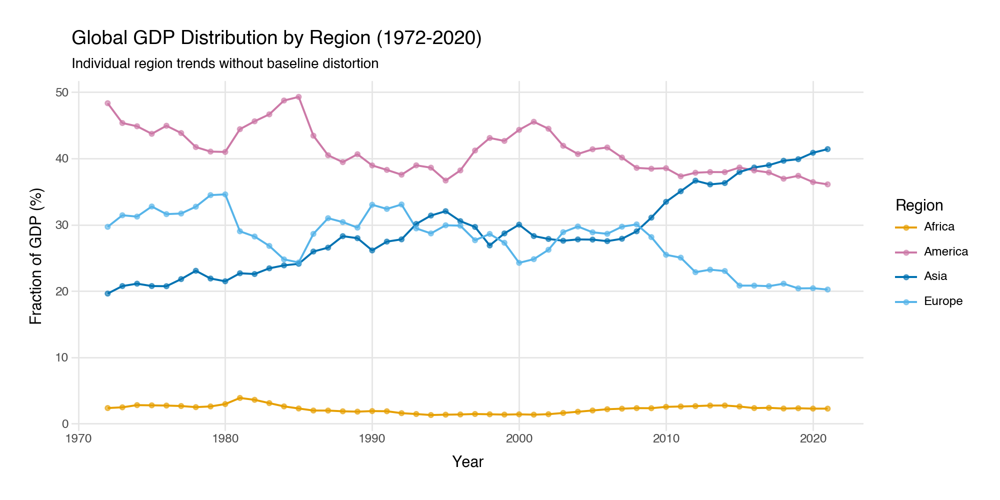

In [164]:
# Insert code here visual 1 
# Remember to print the visual 

gdp_data = pd.read_csv("Homework2_resources/GDP_tidy-1.csv")

#visual_1 = 
(
    ggplot(gdp_data, aes(x='year', y='frac_gdp', color='part_of_world'))
    + geom_line(size=0.8)
    + geom_point(size=1.5, alpha=0.6)
    + scale_color_manual(
        values={
            'Asia': '#0072B2',
            'Europe': '#56B4E9', 
            'America': '#CC79A7',
            'Africa': '#E69F00'
        },
        name='Region'
    )
    + labs(
        title="Global GDP Distribution by Region (1972-2020)",
        subtitle="Individual region trends without baseline distortion",
        x="Year",
        y="Fraction of GDP (%)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        legend_position='right',
        plot_margin=0.03,
        figure_size=(10, 5),
        panel_grid_minor=element_blank()
    )
)

#print(visual_1)

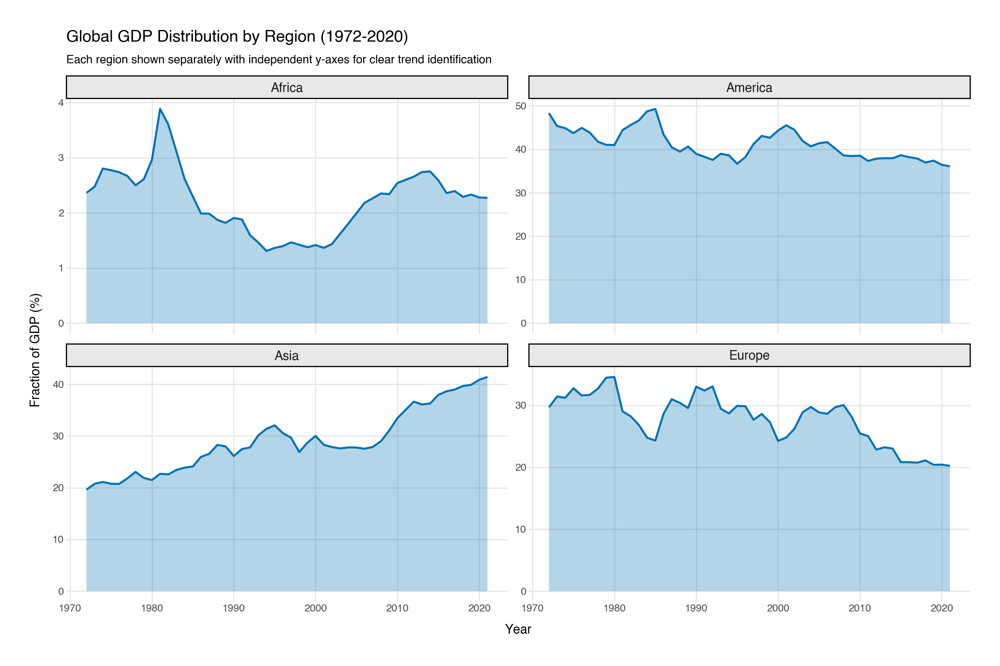

In [162]:
# Insert code here visual 2 
# Remember to print the visual 
#visual_2 = 
(
    ggplot(gdp_data, aes(x='year', y='frac_gdp'))
    + geom_area(fill='#0072B2', alpha=0.3)
    + geom_line(color='#0072B2', size=1)
    + facet_wrap('~part_of_world', ncol=2, scales='free_y')
    + labs(
        title="Global GDP Distribution by Region (1972-2020)",
        subtitle="Each region shown separately with independent y-axes for clear trend identification",
        x="Year",
        y="Fraction of GDP (%)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=10),
        strip_text=element_text(size=11, face='bold'),
        strip_background=element_rect(fill='#e8e8e8'),
        plot_margin=0.03,
        figure_size=(12, 8),
        panel_grid_minor=element_blank()
    )
)

#print(visual_2)

_Brief motivation_


Stacked area charts make it difficult to track individual components because only the bottom category has a consistent baseline at zero, while all other categories are plotted on top of varying baselines. This makes it nearly impossible to accurately compare trends or assess the magnitude of changes for any region except the bottom one.

We created two alternative visualizations that solve this problem. The **first plot uses separate colored lines** for each region, placing all trends on the same zero baseline. This allows immediate and accurate comparison of slopes, growth rates, and magnitudes across all regions. The overlapping lines make it clear that Asia's GDP fraction has grown substantially while Europe's has declined.

The **second plot uses faceting**, giving each region its own dedicated panel. This completely eliminates baseline comparison issues and allows viewers to focus on individual regional patterns without visual interference from other regions. We used independent y-axes to emphasize the shape and direction of each trend, making it easy to identify periods of growth, stability, or decline for each region separately. Both alternatives prioritize the ability to accurately track individual regional trajectories, which is impossible with stacked charts.

### Question 4.3

**Worked on by: Camila**

In some cases a stacked chart works well. On Canvas, I have uploaded one such example. Use the Canvas dataset recreate this visual.


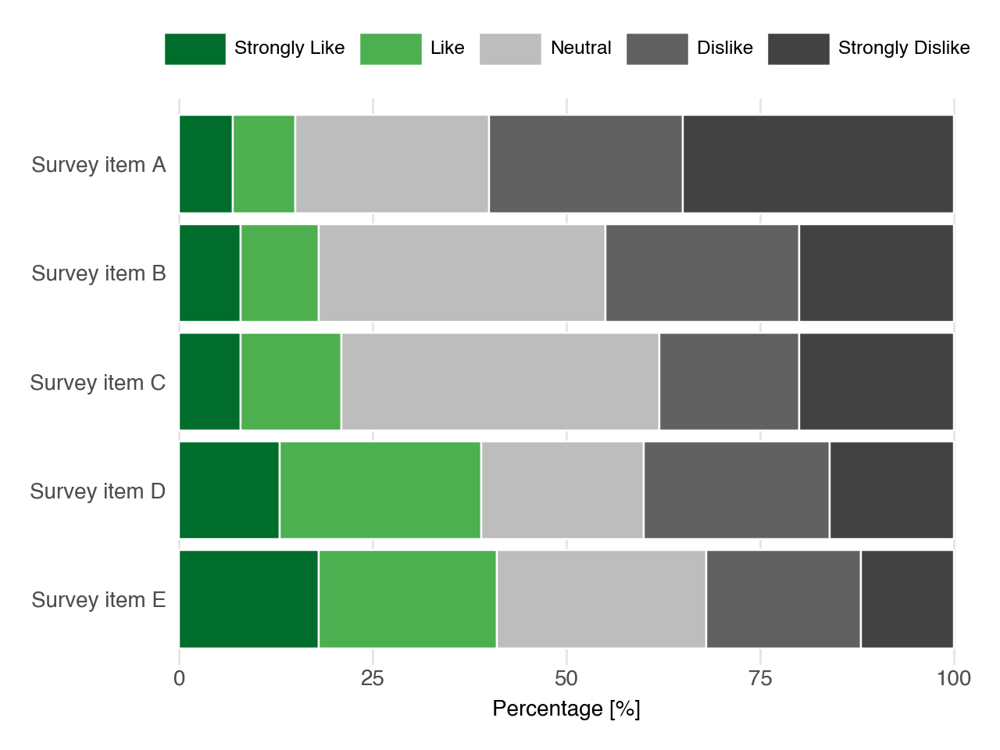

In [185]:
# Insert code here visual 
# Remember to print the visual 

survey_data = pd.read_csv("Homework2_resources/Stacked_good_hw.csv")

category_order = ['Strongly Dislike', 'Dislike', 'Neutral', 'Like', 'Strongly Like']
survey_data['category'] = pd.Categorical(
    survey_data['category'], 
    categories=category_order, 
    ordered=True
)

item_order = ['Survey item E', 'Survey item D', 'Survey item C', 'Survey item B', 'Survey item A']
survey_data['Item'] = pd.Categorical(
    survey_data['Item'], 
    categories=item_order, 
    ordered=True
)

colors_use = ['#424242', '#616161', '#BDBDBD', '#66BB6A', '#1B5E20']

#stacked_plot = 
(
    ggplot(survey_data, aes('Item', 'proportion', fill='category'))
    + geom_bar(stat='identity', width=0.9, color='white', size=0.5)
    + scale_y_continuous(
        expand=(0.01, 0.01),
        breaks=[0, 25, 50, 75, 100]
    )
    + scale_fill_manual(
        values=['#006d2c', '#4CAF50', '#BDBDBD', '#616161', '#424242'], 
        name='',
        limits=['Strongly Like', 'Like', 'Neutral', 'Dislike', 'Strongly Dislike']
    )
    + coord_flip()
    + labs(x='', y='Percentage [%]')
    + theme_minimal()
    + theme(
        legend_position='top',
        legend_key_width=30,
        legend_direction='horizontal',
        legend_title=element_blank(),
        plot_margin=0.03,
        axis_text=element_text(size=10),
        axis_title_x=element_text(size=10),
        panel_grid_major_y=element_blank(),
        panel_grid_minor=element_blank()
    )
)

#print(stacked_plot)

_Motivate why it does work in this case_

The stacked bar chart works well here because we’re comparing overall sentiment, not changes over time. Likert scale data has a natural midpoint, so placing “Neutral” in the center creates a clear split: positive responses (green) grow from the left, and negative responses (dark) from the right. This makes it easy to see which items were viewed more favorably. Item E, for example, shows a stronger positive balance than item A. Unlike the GDP example, we’re not tracking categories over time, so the stacked format is a good fit.

## Assocations 

For this part reading chapter 10-11 in [Fundamentals of Data Visualizations](https://clauswilke.com/dataviz/) can help.

### Question 5.1 

**Worked on by: Daniel and Filip**

Using the dataset with different indicators, such as life-happiness, perception of corruption etc..., compare two variables using a scatter plot. Briefly discuss the take-away from the visual. In the plot colour the different continents.

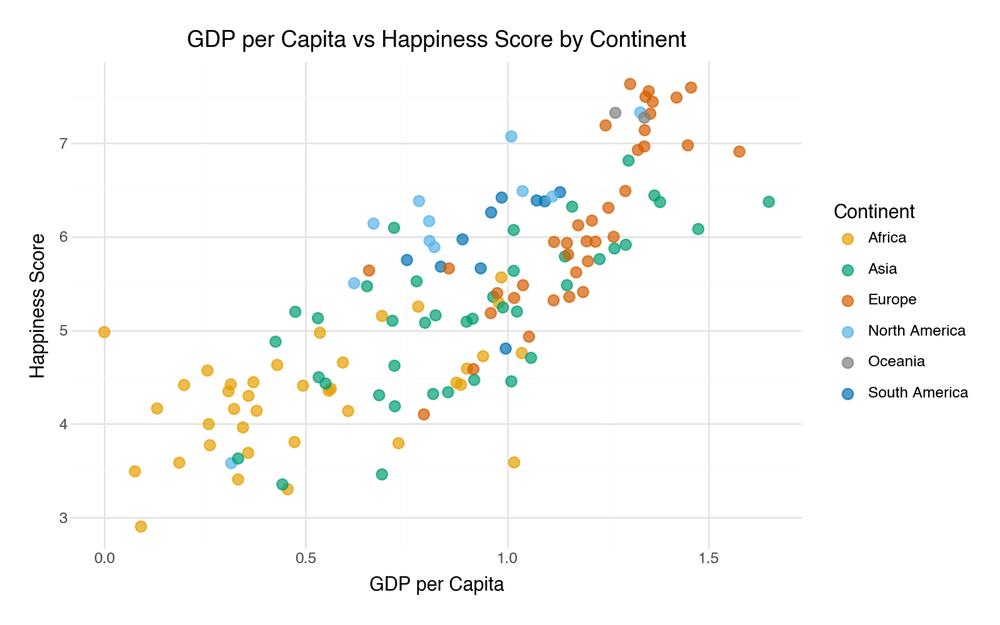

In [192]:
# Insert code here 
# Remember to print the visual 

happiness_data = pd.read_csv("Homework2_resources/World_2018-1.csv")

#scatter_plot = 
(
    ggplot(happiness_data, aes(x='GDP_per_capita', y='Score', color='continent'))
    + geom_point(size=3, alpha=0.7)
    + scale_color_manual(
        values={
            'Africa': cbPalette[0],
            'North America': cbPalette[1],
            'Asia': cbPalette[2],
            'South America': cbPalette[4],
            'Europe': cbPalette[5]
        },
        name='Continent'
    )
    + labs(
        title="GDP per Capita vs Happiness Score by Continent",
        x="GDP per Capita",
        y="Happiness Score"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=13, face='bold'),
        legend_position='right',
        plot_margin=0.03,
        figure_size=(8, 5)
    )
)

#print(scatter_plot)

*Brief motivation*

There’s a clear positive link between GDP per capita and happiness: wealthier countries tend to report higher life satisfaction. European nations cluster in the upper right (high GDP, happiness above 7), while many African countries appear in the lower left (low GDP, happiness around 3–5). Still, the gains taper off at higher income levels, and countries with similar GDP can show very different happiness scores. This suggests that wealth isn’t the whole story, social support, community, and institutional quality also play a major role in overall wellbeing.

### Question 5.2 

**Worked on by: Everyone**

Let us explore the dataset in question 5.1 a bit deeper. Choose five different variables and create two different visuals where we can clearly see the associations between all pair of variables. Briefly discuss the take-away from the visual. 

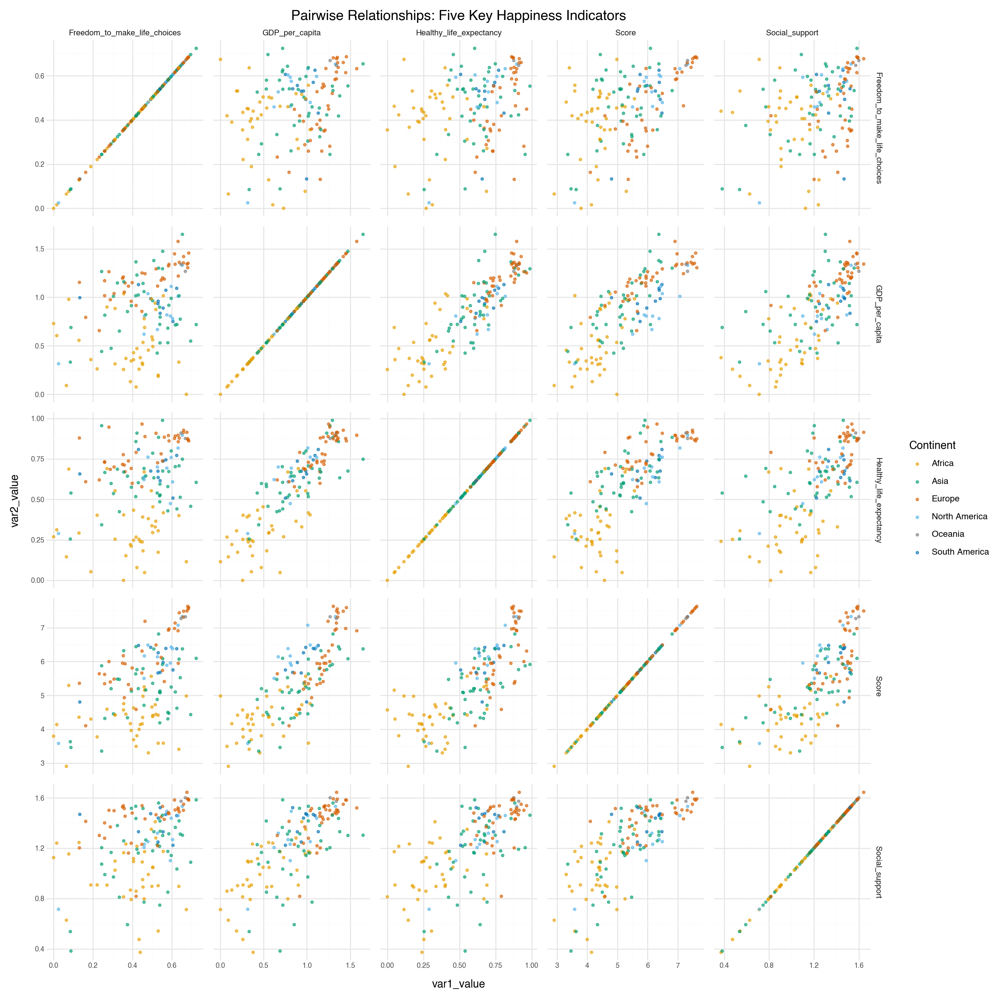

In [193]:
# Insert code here visual 1
# Remember to print the visual 

variables_selected = ['Score', 'GDP_per_capita', 'Social_support', 
                      'Healthy_life_expectancy', 'Freedom_to_make_life_choices']

data_subset = happiness_data[variables_selected + ['continent']].dropna()

plot_data = []
for i, var1 in enumerate(variables_selected):
    for j, var2 in enumerate(variables_selected):
        temp = data_subset.copy()
        temp['var1_name'] = var1
        temp['var2_name'] = var2
        temp['var1_value'] = temp[var1]
        temp['var2_value'] = temp[var2]
        plot_data.append(temp[['var1_name', 'var2_name', 'var1_value', 'var2_value', 'continent']])

plot_df = pd.concat(plot_data, ignore_index=True)

#pairplot = 
(
    ggplot(plot_df, aes(x='var1_value', y='var2_value', color='continent'))
    + geom_point(size=1, alpha=0.6)
    + facet_grid('var2_name ~ var1_name', scales='free')
    + scale_color_manual(
        values={
            'Africa': cbPalette[0],
            'North America': cbPalette[1],
            'Asia': cbPalette[2],
            'South America': cbPalette[4],
            'Europe': cbPalette[5]
        },
        name='Continent'
    )
    + labs(title="Pairwise Relationships: Five Key Happiness Indicators")
    + theme_minimal()
    + theme(
        figure_size=(14, 14),
        axis_text=element_text(size=7),
        strip_text=element_text(size=8),
        plot_title=element_text(size=14, face='bold')
    )
)

#print(pairplot)

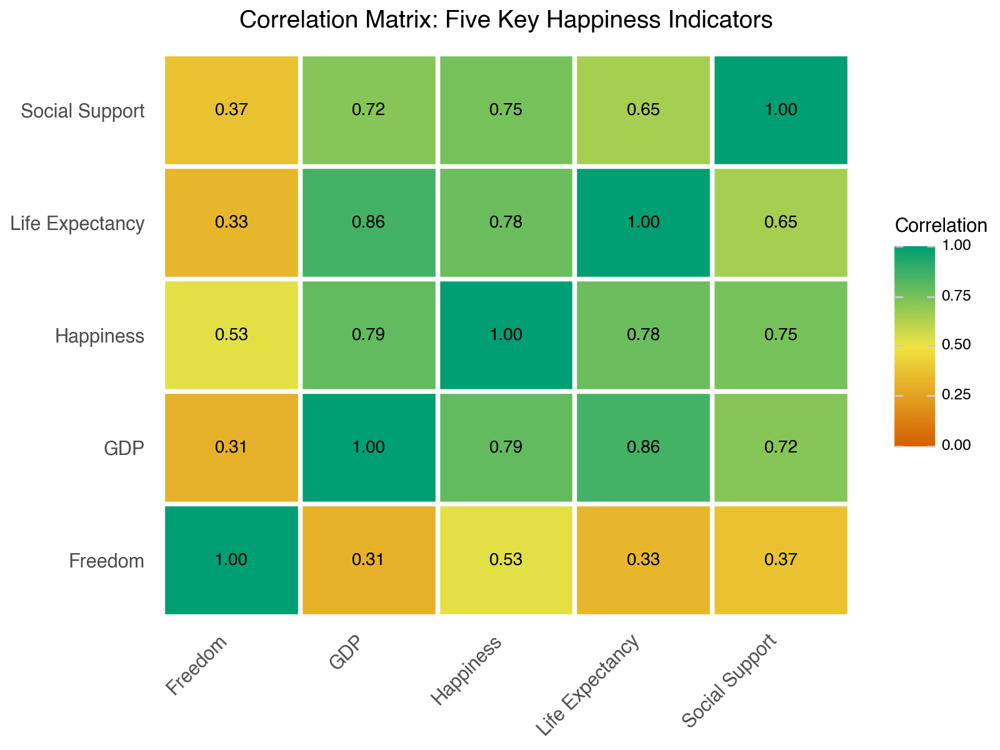

In [197]:
# Insert code here visual 2
# Remember to print the visual 
data_subset = happiness_data[variables_selected].dropna()
correlation_matrix = data_subset.corr()

corr_long = correlation_matrix.reset_index().melt(id_vars='index')
corr_long.columns = ['var1', 'var2', 'correlation']

name_mapping = {
    'Score': 'Happiness',
    'GDP_per_capita': 'GDP',
    'Social_support': 'Social Support',
    'Healthy_life_expectancy': 'Life Expectancy',
    'Freedom_to_make_life_choices': 'Freedom'
}
corr_long['var1'] = corr_long['var1'].map(name_mapping)
corr_long['var2'] = corr_long['var2'].map(name_mapping)

#heatmap = 
(
    ggplot(corr_long, aes(x='var1', y='var2', fill='correlation'))
    + geom_tile(color='white', size=1.5)
    + geom_text(aes(label='correlation'), format_string='{:.2f}', size=10)
    + scale_fill_gradient2(
        low='#D55E00', 
        mid='#F0E442', 
        high='#009E73',
        midpoint=0.5,
        limits=[0, 1],
        name='Correlation'
    )
    + labs(
        title="Correlation Matrix: Five Key Happiness Indicators",
        x="",
        y=""
    )
    + theme_minimal()
    + theme(
        figure_size=(8, 6),
        axis_text_x=element_text(angle=45, hjust=1, size=11),
        axis_text_y=element_text(size=11),
        plot_title=element_text(size=14, face='bold'),
        panel_grid=element_blank()
    )
)

#print(heatmap)

*Brief motivation*

The visualizations show that happiness indicators are tightly linked. GDP, life expectancy, and social support all correlate strongly with happiness (0.75–0.86) and with each other, and the pairplot highlights how European countries cluster at the high end across all measures, while African nations tend to cluster at the lower end. This suggests these factors reinforce one another countries strong in one tend to be strong in others. Freedom has the weakest correlations (0.31–0.53), indicating it behaves more independently. The main takeaway: boosting national wellbeing requires broad, integrated development rather than improving single variables in isolation.

### Question 5.3

Has the amount of $\mathrm{CO}_2$ released per person increased from 1970 to 2018 for a majority of countries, and if yes what magnitude of increase are we talking about? Use the $\mathrm{CO}_2$ on Canvas and create a visual which answers these questions.

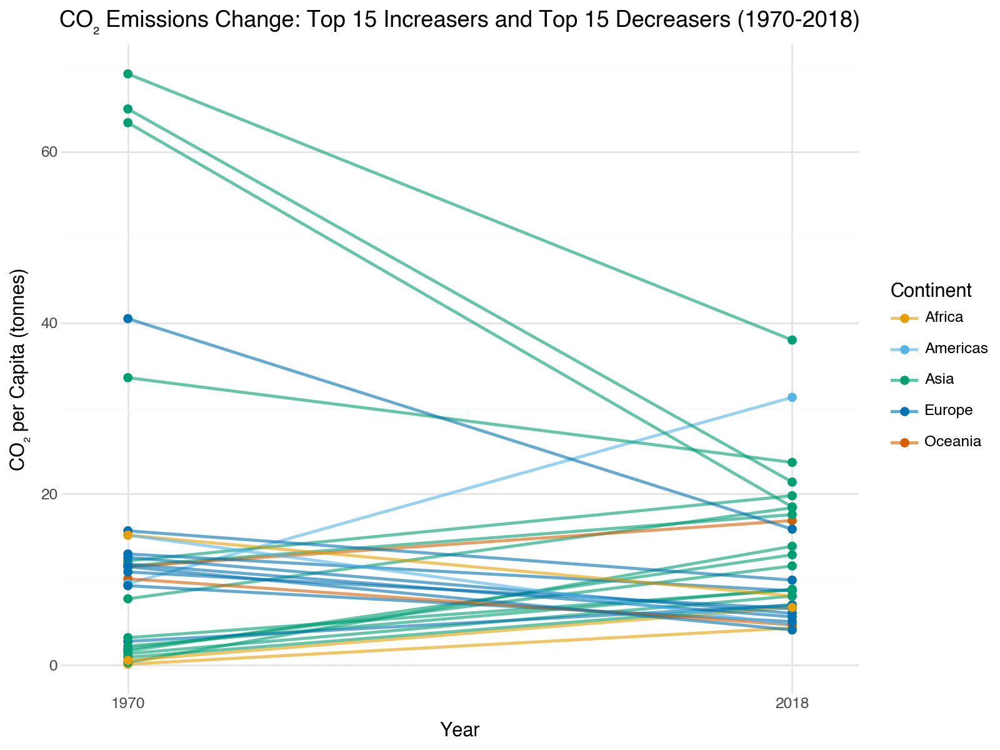

In [211]:
# Insert code here 
# Remember to print the visual 

co2_data = pd.read_csv("Homework2_resources/CO2_data.csv")

co2_data['CO2_change'] = co2_data['CO2_2018'] - co2_data['CO2_1970']
co2_data['CO2_change_pct'] = ((co2_data['CO2_2018'] - co2_data['CO2_1970']) / co2_data['CO2_1970']) * 100

co2_data['change_category'] = co2_data['CO2_change'].apply(
    lambda x: 'Increased' if x > 0.1 else ('Decreased' if x < -0.1 else 'No significant change')
)

co2_long = pd.melt(
    co2_data,
    id_vars=['Country', 'Continent', 'change_category'],
    value_vars=['CO2_1970', 'CO2_2018'],
    var_name='Year',
    value_name='CO2_per_capita'
)

co2_long['Year'] = co2_long['Year'].str.replace('CO2_', '')

co2_data_sorted = co2_data.sort_values('CO2_change', ascending=False)
country_order = co2_data_sorted['Country'].tolist()

top_increasers = co2_data_sorted.head(15)['Country'].tolist()
top_decreasers = co2_data_sorted.tail(15)['Country'].tolist()
countries_to_plot = top_increasers + top_decreasers

co2_filtered = co2_long[co2_long['Country'].isin(countries_to_plot)].copy()
co2_filtered['Country'] = pd.Categorical(
    co2_filtered['Country'],
    categories=countries_to_plot,
    ordered=True
)

#slope_plot = 
(
    ggplot(co2_filtered, aes(x='Year', y='CO2_per_capita', group='Country', color='Continent'))
    + geom_line(size=1, alpha=0.6)
    + geom_point(size=2)
    + scale_color_manual(
        values={
            'Africa': cbPalette[0],
            'Americas': cbPalette[1],
            'Asia': cbPalette[2],
            'Europe': cbPalette[4],
            'Oceania': cbPalette[5]
        },
        name='Continent'
    )
    + scale_x_discrete(expand=(0.05, 0.05))
    + labs(
        title="CO₂ Emissions Change: Top 15 Increasers and Top 15 Decreasers (1970-2018)",
        x="Year",
        y="CO₂ per Capita (tonnes)"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=13, face='bold'),
        figure_size=(8, 6),
        legend_position='right'
    )
)

#print(slope_plot)

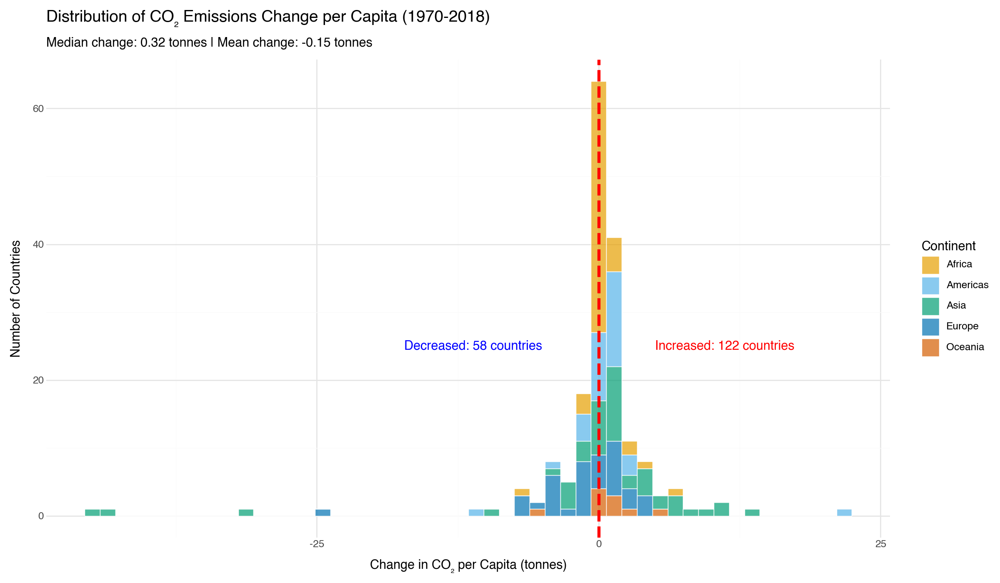

In [212]:
# Insert code here for question 5.3
# Remember to print the visual

#histogram_plot = 
(
    ggplot(co2_data, aes(x='CO2_change', fill='Continent'))
    + geom_histogram(bins=50, alpha=0.7, color='white', size=0.3)
    + geom_vline(xintercept=0, linetype='dashed', color='red', size=1.5)
    + annotate('text', x=5, y=25, label=f'Increased: {(co2_data["CO2_change"] > 0).sum()} countries', 
               size=11, ha='left', color='red')
    + annotate('text', x=-5, y=25, label=f'Decreased: {(co2_data["CO2_change"] < 0).sum()} countries', 
               size=11, ha='right', color='blue')
    + scale_fill_manual(
        values={
            'Africa': cbPalette[0],
            'Americas': cbPalette[1],
            'Asia': cbPalette[2],
            'Europe': cbPalette[4],
            'Oceania': cbPalette[5]
        },
        name='Continent'
    )
    + labs(
        title="Distribution of CO₂ Emissions Change per Capita (1970-2018)",
        subtitle=f"Median change: {co2_data['CO2_change'].median():.2f} tonnes | Mean change: {co2_data['CO2_change'].mean():.2f} tonnes",
        x="Change in CO₂ per Capita (tonnes)",
        y="Number of Countries"
    )
    + theme_minimal()
    + theme(
        plot_title=element_text(size=14, face='bold'),
        plot_subtitle=element_text(size=11),
        figure_size=(12, 7)
    )
)

#print(histogram_plot)

_Motivate your answer here_